In [ ]:
# Unzip uploaded data into GoogleDrive
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision"

# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.


## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know which breed of dog it is.


## 2. Data

The data being used is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data


## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.


## 4. Features

Some information about the data:
* We're dealing with images (unstructured data), so it's probably best to use deep learning and transfer learning
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set; around 10,000+ images in the test set as well.
* Training set images have labels
* Some test set images have labels, some of them do not.

In [1]:
# Import TensorFlow 2.x (and tf Hub) into Colab
# Import TensorFlow Hub
import tensorflow as tf
print("TF version:", tf.__version__)

import tensorflow_hub as hub
print(hub.__version__)

TF version: 2.11.0
0.12.0


In [2]:
# Check for GPU availability
def check_gpu():
  print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available :^(")

## Getting our data ready (turning it into Tensors)

In any machine learning model, our data has to be converted to numerical format. We will be turning our images into tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [3]:
# Checkout the labels of our data
import pandas as pd
labels_csv =pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


85.18333333333334

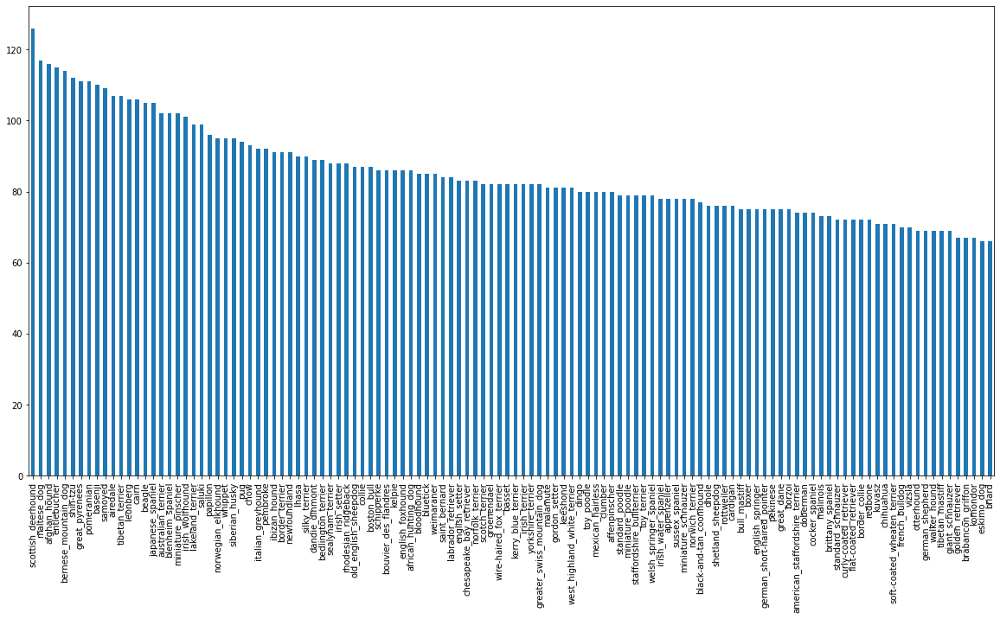

In [5]:
# How many images are there of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))
labels_csv["breed"].value_counts().mean()

In [6]:
labels_csv["breed"].value_counts().median()

82.0

Google recommends a minimum number of images per class of 10 (100+ recommended)

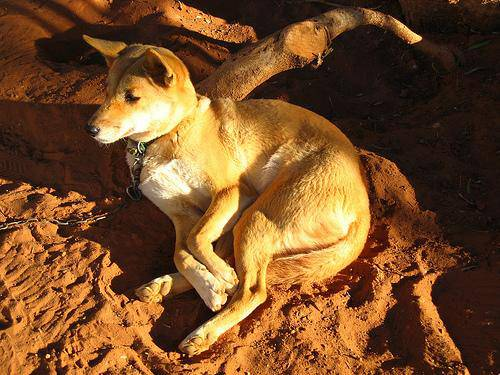

In [7]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting Images and their Labels

Let's get a list of all of our image file path names.

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
# Check whether number of filenames matches number of actual images
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount. Proceed!")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount. Proceed!


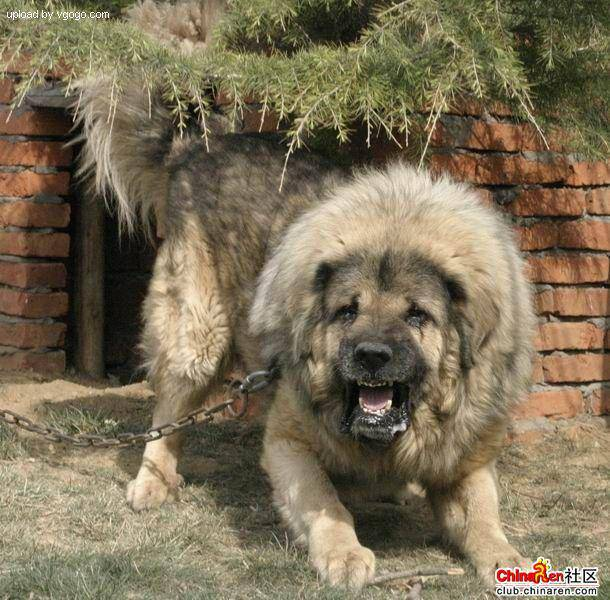

In [11]:
# One more check
Image(filenames[9000])

In [12]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [13]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


## Turn our Data into Numbers (Tensors)

Since we've now got our image filepaths in a list, let's prepare our labels.

In [14]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels= np.array(labels) # deos same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
# See if number of labels mathes the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of file names.")
else:
  print("Number of labels does not match numer of file names...")

Number of labels matches number of file names.


In [17]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [18]:
len(unique_breeds)

120

In [19]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [21]:
# These arrays will help us convert the labels into numbers
# More specifically, we can turn them into OneHotEncoded numbers

# Example: Turning boolean array into integers:
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [23]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

## Creating our own Validation Set

Since our data from Kaggle doesn't come with a validation set, we will have to create our own.

In [24]:
# Setup X & y variables
x = filenames
y = boolean_labels

In [25]:
len(filenames)

10222

# REMEMBER: our goal is to minimize time between experiments (starting w/ 1k images)

In [26]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [27]:
# Let's split our data into train and validation set
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [28]:
# Let's have a peek at the raining data
x_train[:5]

['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg']

In [29]:
y_train[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

# Turn our Images into Tensors (preprocessing our images)

To preprocess our images into Tensors, we're going to write a function that does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 ---> 0-1)
5. Resize the `image` to be shape of (224, 224)
6. Return the modified `image`.

Manipulating a file path is easier than manipulating a full image for each label...

Ways of loading data into TensorFlow (w/ tutorials:
                                      https://www.tensorflow.org/guide/data)

In [30]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [31]:
# turn image into a tensor
tf.constant(image)[:2] # now able to run on a GPU as a tensor

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [32]:
image.max(), image.min()

(255, 0)

Now we've seen what an image looks like as a tensor. Let's make a function to preprocess them.

In [33]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):

  """
  Take an image file path and turns the image into a Tensor
  """

  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value(224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [34]:
# (Not part of the workflow - for demonstration only)
tensor = tf.io.read_file(filenames[26])
tf.image.decode_jpeg(tensor, channels=3)

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

## Turning Our Data into Batches

Why turn our data into batches? (Small portion of data - images, in this case)

Let's say you're trying to process 10k+ images in one go, they all might not fit into memory.

That's why we do about 32 images (batch size) at a time (you can manually adjust this if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples, which look like this:
`(image, label)`.

In [35]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Take an image file path name and the associated label,
  processes the image and returns a tuple of (image, label):
  """

  image = process_image(image_path)
  return image, label

In [36]:
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`x` & `y`) into batches.

In [37]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data, but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """

  # If the data is a test data set, we likely don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid data set, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")

    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))  

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (also turns image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch

In [38]:
# Create training and validation data batches
train_data = create_batches(x_train, y_train)
val_data = create_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [39]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [40]:
y[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

### Visualizing Data Batches

Our data is now in batches. However, these can be a little hard to understand... let's visualize them.

In [41]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))

  # Loop through 25 (displaying 25 images)
  for i in range(25):
    # Create subplots (5, rows, 5 cols)
    ax = plt.subplot(5, 5, i+1)

    # Display an image
    plt.imshow(images[i])

    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])

    # Turn gridlines off
    plt.axis("off")

In [44]:
len(train_images), len(train_labels)

(32, 32)

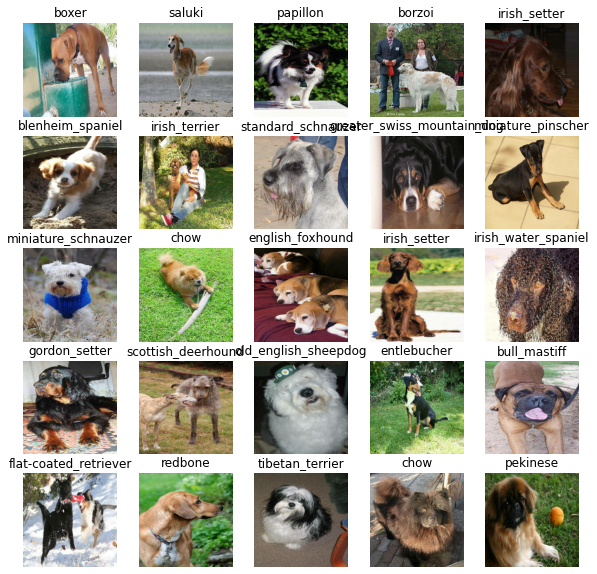

In [45]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

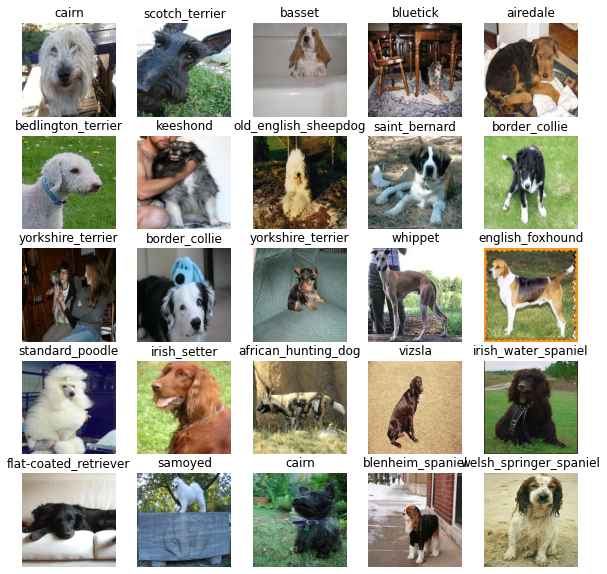

In [46]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a Model

Before we build a model, there are a few things we need to define:
1. The input shape (our images shape, in the form of Tensors) to our model
2. The output shape (image labels, in the forms of Tensors) of our model
3. The URL of the model we want to use from TensorFlow Hub

In [47]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

 # Setup model URL from TensorFlow Hub (multi-class image classification)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now we've got out inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model.

Knowing this, let's create a function which:
* Takes the input shape, output shape, and our chosen model as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that)
* Compiles the model (says how it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model

All of these steps can be foun here:
https://www.tensorflow.org/guide/keras/overview

In [48]:
# Create a function that builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)         
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # "how high you are on the hill"
      optimizer=tf.keras.optimizers.Adam(), # provide feedback to optimizie `loss`
      metrics=["accuracy"] # the judge monitoring performance
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [49]:
check_gpu()

GPU available


In [50]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if it stops improving.

We'll create two callbacks, one for TensorBoard, which helps track our model's progress, and another for early stopping, which prevents our model from training too long.

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback that is able to save logs to a directory and pass it to our model's `fit()` function
3. Visualize our models training logs with the `%tensorboard` magic function (done after model training)

In [51]:
# Load TensorBoard notebook extenstion
%load_ext tensorboard

In [52]:
import datetime

# Create a function to build a TensorBoard callback
def create_tb_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStoppin


In [53]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) 
# patience = no. of epochs after which to stop training

## Training a model (on subset of data)

Our first model is only going to train on 1,000 images to make sure that everything is working.



In [54]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, steo:10}

In [55]:
# Check to make sure we're still running on a GPU
check_gpu()

GPU available


In [57]:
# IDEALLY, DON'T RUN THE FOLLOWING WITHOUT GPU RUNNING

Let's create a function which trains a model:

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call `fit()` function on our model, passing it the training data, validation data, number of epochs to train (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [58]:
# Build a function to train and return a trained model:
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tb_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  
  # Return fitted model
  return model

In [59]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 103s 4s/step - loss: 4.5047 - accuracy: 0.1163 - val_loss: 3.3843 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 3s 122ms/step - loss: 1.5788 - accuracy: 0.7025 - val_loss: 2.1527 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 3s 116ms/step - loss: 0.5654 - accuracy: 0.9400 - val_loss: 1.7097 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 4s 147ms/step - loss: 0.2503 - accuracy: 0.9875 - val_loss: 1.5277 - val_accuracy: 0.5900
Epoch 5/100
25/25 [==============================] - 3s 116ms/step - loss: 0.1454 - accuracy: 0.9962 - val_loss: 1.4435 - val_accuracy: 0.6050
Epoch 6/100
25/25 [==============================] - 4s 148ms/step - loss: 0.0993 - accuracy: 1.0000 - val_loss: 1.4151 - val_accuracy: 0.6100
Epoch 7/100
25/25 [==============================

It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset. What are some ways to prevent model overfitting in deep learning neural networks?


**NOTE:** Overfitting to begin with is a good thing! It means the model is learning!!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [60]:
# Visualize how experiments are going; needs the log file path name
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and Evaluating Predictions Using a Trained Model

In [61]:
# Make predictions on the validation data (not used to train on)

predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 45s 91ms/step


array([[1.1546689e-03, 6.1886683e-05, 2.7707877e-04, ..., 3.1574268e-04,
        1.7691309e-05, 9.5946772e-04],
       [2.9067216e-03, 1.3504644e-03, 2.2507856e-02, ..., 2.0932907e-03,
        8.2987370e-03, 3.7183225e-05],
       [7.3367837e-06, 4.5921224e-06, 5.5150572e-06, ..., 5.0753944e-05,
        2.7522745e-05, 1.6019869e-04],
       ...,
       [7.8089552e-06, 8.8445713e-06, 2.3293931e-06, ..., 2.1872578e-05,
        3.2794978e-05, 5.1335581e-05],
       [2.6575187e-03, 6.9732087e-05, 2.4882206e-04, ..., 2.1177577e-04,
        1.6482199e-04, 4.7077197e-03],
       [5.7440775e-04, 6.2458290e-05, 7.3580765e-03, ..., 2.6553038e-03,
        3.6428680e-03, 5.9523102e-04]], dtype=float32)

In [62]:
predictions.shape

(200, 120)

In [63]:
len(y_val)

200

In [64]:
len(unique_breeds)

120

In [66]:
len(predictions[0])

120

In [67]:
np.sum(predictions[0])

1.0

In [68]:
# First prediction

index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.15466886e-03 6.18866834e-05 2.77078769e-04 3.93169466e-04
 5.65028568e-05 2.06572131e-05 2.54442962e-03 8.96480487e-05
 1.36242006e-05 1.91383544e-04 1.16292686e-04 1.25658698e-04
 3.43056541e-04 7.74652581e-05 2.02233001e-04 7.12347392e-05
 2.01031089e-05 9.38374996e-02 1.24583512e-05 5.87876930e-05
 4.19251592e-04 5.03769916e-05 1.11509498e-05 2.03168136e-03
 4.78172387e-06 2.34542254e-04 3.98929715e-01 3.66386848e-05
 2.90026801e-04 3.48811329e-04 3.49839902e-05 3.29094706e-04
 7.63354008e-04 6.74008770e-05 8.40888752e-05 2.14551799e-02
 1.44051282e-05 4.66899401e-05 5.98870647e-05 8.90076844e-05
 1.22536300e-03 1.99682872e-05 2.84036178e-05 1.40048709e-04
 1.48183808e-05 1.51349712e-04 1.24568745e-04 6.96804127e-05
 7.67350197e-04 2.20724382e-04 5.38679633e-05 6.49186331e-05
 2.64205388e-04 9.86582891e-05 8.25974203e-05 4.94991509e-05
 1.66546772e-04 1.74007285e-03 1.89831277e-04 4.94878627e-02
 4.11888934e-04 1.96241472e-05 4.02420294e-04 1.51416043e-05
 3.59756144e-04 1.291453

Having the above functionality is great, but we want to be able to do it at scale.

And it would be even better if we could see the image that the prediction is being made on.

**NOTE:** prediction probabilities are also known as confidence levels.

In [69]:
# Turn prediction probabilities into their respective label (easier to understand)

def get_pred_label (prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [70]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now, since our validation data is still in a batch data set (because this makes it easier for tf to make calculations), we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation lables (truth labels).

In [71]:
# Create a function to unbatch dataset

images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [72]:
get_pred_label(labels_[0])

'cairn'

In [73]:
get_pred_label(predictions[0])

'cairn'

In [74]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """

  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [75]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make these all a bit more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of trurth labels, and an array of images and integers
* Convert the prediction probabilities to a predicted label
* Plot the predicted label, its predicted probability, the truth label, and the target image on a single plot.

In [76]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction, and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)

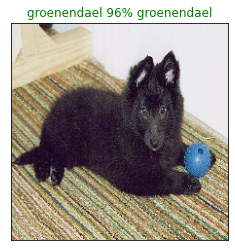

In [77]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n=77)

Now we've got one function to visualize our models top predictions. Let's make another to view our model's top 10 predictions.

This function will:
* Take an input of prediction probabilities array, a ground truth array, and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability value and labels, coloring the true label green

In [78]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  # Get the prediction label
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Set up plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


In [79]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.39892972, 0.24237305, 0.0938375 , 0.0663328 , 0.04948786,
       0.02145518, 0.01769773, 0.01578725, 0.01310055, 0.01291453],
      dtype=float32)

In [80]:
predictions[0].argsort()[-10:][::-1]

array([ 26, 103,  17, 109,  59,  35, 102,  73, 100,  65])

In [81]:
predictions[0].max()

0.39892972

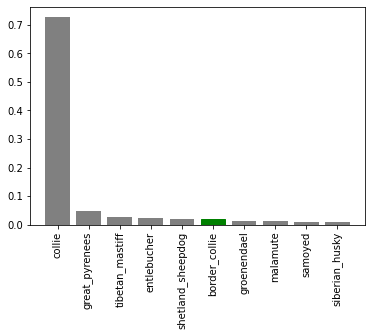

In [82]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model. Let's check out a few...

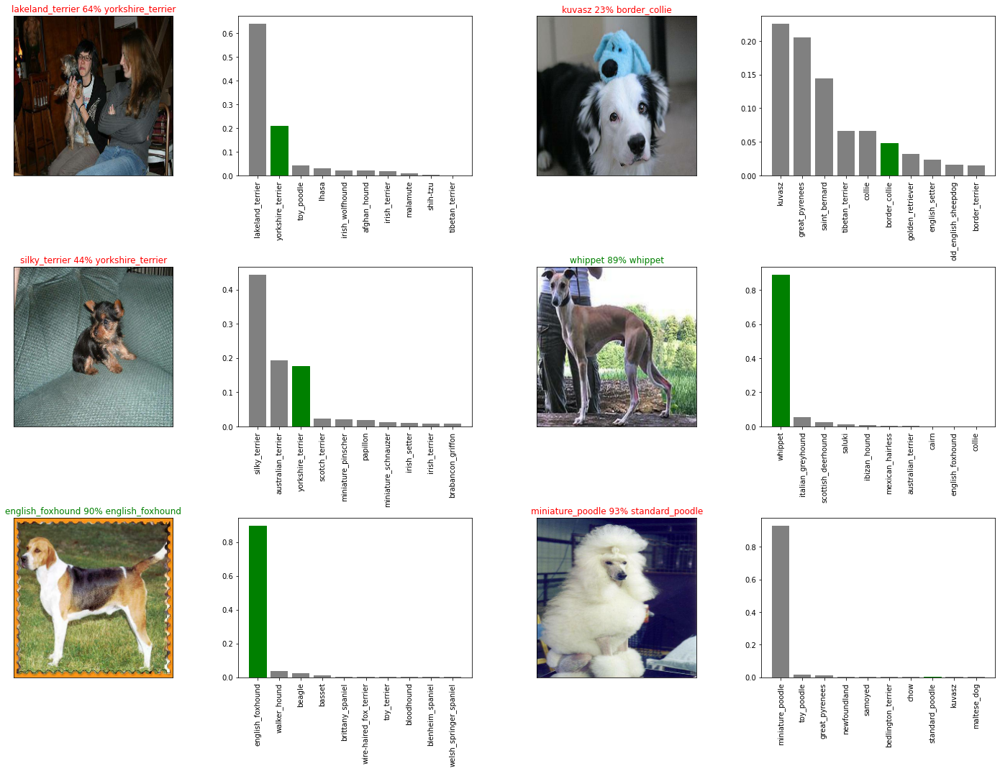

In [83]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and Reloading a Trained Model

In [84]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model(s)
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [85]:
# Create a function to load a model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}.")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [86]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-img-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20230223-03361677123367-1000-img-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230223-03361677123367-1000-img-mobilenetv2-Adam.h5'

In [87]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20230112-02121673489571-1000-img-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20230112-02121673489571-1000-img-mobilenetv2-Adam.h5.


In [88]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 88ms/step - loss: 1.3121 - accuracy: 0.6400


[1.312086820602417, 0.6399999856948853]

In [89]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 120ms/step - loss: 1.2229 - accuracy: 0.6900


[1.2229301929473877, 0.6899999976158142]

## Training a Model (on the full data)

In [90]:
len(x), len(y)

(10222, 10222)

In [91]:
x[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [92]:
x_train[:10]

['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
 'drive/MyDrive/Dog Vision/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
 'drive/MyDrive/Dog Vision/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
 'drive/MyDrive/Dog Vision/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
 'drive/MyDrive/Dog Vision/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
 'drive/MyDrive/Dog Vision/train/143b9484273e57668d03bfc26755810a.jpg']

In [93]:
len(x_train)

800

In [94]:
# Create a data batch with the full data set
full_data = create_batches(x, y)

Creating training data batches...


In [95]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [96]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [97]:
# Create full model callbacks
full_model_tensorboard = create_tb_callback()

# No validation set when training on all the data, so we can't monitor
# validation accuracy...
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the next cell down will take a little while (maybe up to 30+ min for the first epoch) because the GPU we're using in the runtime has to run all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x = full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 2084s 7s/step - loss: 1.3487 - accuracy: 0.6645
Epoch 2/100
320/320 [==============================] - 38s 119ms/step - loss: 0.4020 - accuracy: 0.8830
Epoch 3/100
320/320 [==============================] - 39s 122ms/step - loss: 0.2371 - accuracy: 0.9342
Epoch 4/100
320/320 [==============================] - 41s 128ms/step - loss: 0.1539 - accuracy: 0.9630
Epoch 5/100
320/320 [==============================] - 49s 153ms/step - loss: 0.1057 - accuracy: 0.9796
Epoch 6/100
320/320 [==============================] - 48s 149ms/step - loss: 0.0779 - accuracy: 0.9859
Epoch 7/100
320/320 [==============================] - 48s 151ms/step - loss: 0.0589 - accuracy: 0.9917
Epoch 8/100
320/320 [==============================] - 49s 153ms/step - loss: 0.0457 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 47s 147ms/step - loss: 0.0397 - accuracy: 0.9952
Epoch 10/100
320/320 [==============================] - 47s 146ms

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20230112-03291673494174-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230112-03291673494174-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20230112-03291673494174-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20230112-03291673494174-full-image-set-mobilenetv2-Adam.h5.


## Making predictions on the test data set...

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily, we created `create_data_batches()` earlier which can take a list of filenames as input and coonvert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames

test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e800b6c8d2904e205d67ada800907762.jpg',
 'drive/MyDrive/Dog Vision/test/df624595296500c98e3a1bf4d9ea917b.jpg',
 'drive/MyDrive/Dog Vision/test/e0bf90705facb623a6f36046cc495659.jpg',
 'drive/MyDrive/Dog Vision/test/e0eea374c5170e90dc0b1ee795470ca6.jpg',
 'drive/MyDrive/Dog Vision/test/e7129bc2dbbba99bedc87c7787cbdf1f.jpg',
 'drive/MyDrive/Dog Vision/test/e402619cf0a1766811068db0dd42fbae.jpg',
 'drive/MyDrive/Dog Vision/test/dff6d0e5746812e0e5808c0e69a20574.jpg',
 'drive/MyDrive/Dog Vision/test/e18fbb12037c297b90642e99073cd6b4.jpg',
 'drive/MyDrive/Dog Vision/test/e334f758c7944df19c98d49498d28c64.jpg',
 'drive/MyDrive/Dog Vision/test/e5b13519aa192a386dc0c5dd7d096e70.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_batches(test_filenames, test_data = True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**NOTE:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (~1hr+).

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 2326s 7s/step


In [ ]:
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.0691576e-10, 2.9626516e-12, 7.8190517e-11, ..., 4.5127665e-05,
        1.8237754e-08, 9.4759660e-12],
       [1.6461493e-07, 1.2432817e-07, 3.2929975e-07, ..., 4.1363393e-09,
        4.7067889e-08, 4.0212476e-01],
       [1.4323040e-08, 4.0137613e-09, 1.4798320e-08, ..., 4.0132832e-07,
        1.6023260e-10, 2.4787744e-10],
       ...,
       [1.9250631e-08, 4.4608526e-09, 3.3051769e-08, ..., 1.0902726e-08,
        4.7360570e-07, 7.4008711e-02],
       [1.3139029e-06, 3.3446246e-09, 9.0608863e-09, ..., 7.7209732e-09,
        5.5384611e-05, 3.8087254e-07],
       [1.1129665e-10, 2.1002318e-11, 1.3205842e-10, ..., 8.3462787e-08,
        5.1439152e-12, 1.6915056e-11]], dtype=float32)

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our model's prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with and ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit to Kaggle

In [ ]:
# Create a pandas df with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to prediction DF
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/Dog Vision/test/e800b6c8d2904e205d67ada800907762', '.jpg')

In [ ]:
preds_df.head()

['e800b6c8d2904e205d67ada800907762',
 'df624595296500c98e3a1bf4d9ea917b',
 'e0bf90705facb623a6f36046cc495659',
 'e0eea374c5170e90dc0b1ee795470ca6',
 'e7129bc2dbbba99bedc87c7787cbdf1f',
 'e402619cf0a1766811068db0dd42fbae',
 'dff6d0e5746812e0e5808c0e69a20574',
 'e18fbb12037c297b90642e99073cd6b4',
 'e334f758c7944df19c98d49498d28c64',
 'e5b13519aa192a386dc0c5dd7d096e70',
 'e64b15ca154304104fe95ded7338858e',
 'eb278b7573e08beb43823a006a7ba690',
 'ed6d16749ad7dbed282857c6c0cb0b64',
 'f14672c3ea8086560de6b7e79f9b90d1',
 'eee6679003d570e8370d1fcca75984c9',
 'f0f205d037fe626670165aca00fc8b81',
 'f59518330db44c70a9bad7e8a4314f3b',
 'e806fbb5ca4dd3a094f7819bd810cc65',
 'f1f339f43e83cfb8e4bf76ff5671489c',
 'f28e776762aba6a080ab11ffb40e8d04',
 'f3b603f10d6a344f0395fb46b242ff8e',
 'ed9bab128c26470e18631cb6f3454c99',
 'f31bfb17e3d1800493376fffd77fed72',
 'f10241d199251db359961e814733efc5',
 'f1dcabbeb1dbebb326a4b029b6f8b188',
 'ef5f1eb55d91360df896824ac4cc979b',
 'eb3849def6fa245bcaae9ab9c64f024f',
 

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e800b6c8d2904e205d67ada800907762,1.069158e-10,2.962652e-12,7.819052e-11,3.142496e-13,2.075399e-06,6.499216e-08,5.149334e-07,9.965619e-01,2.593303e-09,...,2.654549e-08,6.723441e-08,9.162768e-10,5.899764e-06,2.729052e-08,1.063428e-07,1.361162e-08,4.512766e-05,1.823775e-08,9.475966e-12
1,df624595296500c98e3a1bf4d9ea917b,1.646149e-07,1.243282e-07,3.292998e-07,1.779917e-09,4.541886e-08,2.019597e-09,1.855342e-03,1.302154e-08,3.857532e-08,...,4.689405e-08,1.636459e-07,4.371531e-08,1.058285e-10,1.163695e-08,5.332650e-07,2.962141e-06,4.136339e-09,4.706789e-08,4.021248e-01
2,e0bf90705facb623a6f36046cc495659,1.432304e-08,4.013761e-09,1.479832e-08,3.614970e-10,5.028700e-07,1.605989e-07,2.105831e-11,5.115258e-08,2.106967e-08,...,7.913755e-08,2.102136e-06,2.781514e-09,9.269866e-07,4.831945e-09,2.151958e-10,3.351503e-11,4.013283e-07,1.602326e-10,2.478774e-10
3,e0eea374c5170e90dc0b1ee795470ca6,2.277682e-07,4.316990e-08,5.822878e-08,1.253536e-07,1.433026e-06,1.506216e-09,1.595571e-07,8.559425e-07,8.314532e-09,...,9.504592e-01,3.863055e-06,4.504750e-08,3.234175e-07,7.826189e-08,6.209177e-08,3.301296e-03,6.074045e-09,2.871185e-05,2.557610e-06
4,e7129bc2dbbba99bedc87c7787cbdf1f,3.903278e-06,2.305151e-10,5.761001e-08,5.718796e-12,1.238738e-09,7.694744e-07,1.049494e-08,3.588945e-07,8.685707e-09,...,7.427753e-06,6.680084e-03,1.723112e-07,1.806020e-10,8.012462e-07,6.262124e-08,1.113381e-06,1.256949e-07,2.921306e-07,3.683377e-03


In [ ]:
# Save our predictions DataFrame to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submissions_1_mobilenetv2.csv",
                index = False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images (upload to gDrive if you have to)
* Turn the filepaths into data batches using `create_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`
* Pass the custom image data batch to our model's `predict()` method
* Convert the prediction output probabilities to prediction labels
* Compare the predicted labels to the custom images





In [ ]:
# Get the custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/20201206_121251.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/20201224_132755.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/20210329_132558.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['beagle', 'shih-tzu', 'beagle']

In [ ]:
# Get custom images (our unbatchify function won't work without labels... maybe this could be fixed later)

custom_images = []

# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

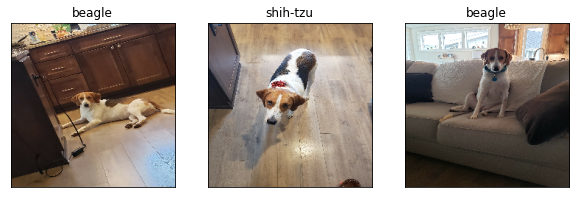

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

## [ Thank You ]